In [1]:
!pip install --upgrade scipy

Requirement already up-to-date: scipy in c:\programdata\anaconda3\lib\site-packages (1.10.1)


In [1]:
import pandas as pd
import numpy as np
import yaml
import copy
import matplotlib
import matplotlib.pyplot as plt
import warnings
import random
import collections
from itertools import combinations, groupby
warnings.filterwarnings("ignore")
import networkx as nx
import scipy as sp
import scipy.sparse
%matplotlib inline
#plt.style.use('seaborn-darkgrid')
from collections import Counter
from matplotlib.cm import ScalarMappable
import matplotlib.ticker as mticker

In [2]:
df1=pd.read_csv(r"A:\Spring 2020\Rough Works\Japan Metro\Washington_DC\Edge_CSV.csv")
df2=pd.read_csv(r"A:\Spring 2020\Rough Works\Japan Metro\Boston_MBTA\Edge_CSV.csv")
df3=pd.read_csv(r"A:\Spring 2020\Rough Works\Japan Metro\Chicago_L\Edge_CSV.csv")
df4=pd.read_csv(r"A:\Spring 2020\Rough Works\Japan Metro\Delhi_Metro\Edge_CSV.csv")
df5=pd.read_csv(r"A:\Spring 2020\Rough Works\Japan Metro\Tokyo_Metro\Edge_CSV.csv")
df6=pd.read_csv(r"A:\Spring 2020\Rough Works\Japan Metro\Paris_Metro\Edge_CSV.csv")
df7=pd.read_csv(r"A:\Spring 2020\Rough Works\Japan Metro\Shanghai_Metro\Edge_CSV.csv")
df8=pd.read_csv(r"A:\Spring 2020\Rough Works\Japan Metro\London_Metro\Edges_all.csv",encoding='latin-1')
df9=pd.read_csv(r"A:\Spring 2020\Rough Works\Japan Metro\New_York_MTA\Edge_CSV.csv",encoding='latin-1')

In [3]:
edge_list_W = list(zip(df1['Source'], df1['Target']))
edge_list_B = list(zip(df2['Source'], df2['Target']))
edge_list_C = list(zip(df3['Source'], df3['Target']))
edge_list_D = list(zip(df4['Source'], df4['Target']))
edge_list_T = list(zip(df5['Source'], df5['Target']))
edge_list_P = list(zip(df6['Source'], df6['Target']))
edge_list_S = list(zip(df7['Source'], df7['Target']))
edge_list_L = list(zip(df8['Source'], df8['Target']))
edge_list_N = list(zip(df9['Source'], df9['Target']))

In [4]:
G_W = nx.Graph()
G_W.add_edges_from(edge_list_W)

G_B = nx.Graph()
G_B.add_edges_from(edge_list_B)

G_C = nx.Graph()
G_C.add_edges_from(edge_list_C)

G_D = nx.Graph()
G_D.add_edges_from(edge_list_D)

G_T = nx.Graph()
G_T.add_edges_from(edge_list_T)

G_P = nx.Graph()
G_P.add_edges_from(edge_list_P)

G_S = nx.Graph()
G_S.add_edges_from(edge_list_S)

G_L = nx.Graph()
G_L.add_edges_from(edge_list_L)

G_N = nx.Graph()
G_N.add_edges_from(edge_list_N)

In [5]:
# Node & Edge List of Graphs
node_list_W = list(G_W.nodes())
node_list_B = list(G_B.nodes())
node_list_C = list(G_C.nodes())
node_list_D = list(G_D.nodes())
node_list_T = list(G_T.nodes())
node_list_P = list(G_P.nodes())
node_list_S = list(G_S.nodes())
node_list_L = list(G_L.nodes())
node_list_N = list(G_N.nodes())
# --------------->><<-------------------

edge_list_W = list(G_W.edges())
edge_list_B = list(G_B.edges())
edge_list_C = list(G_C.edges())
edge_list_D = list(G_D.edges())
edge_list_T = list(G_T.edges())
edge_list_P = list(G_P.edges())
edge_list_S = list(G_S.edges())
edge_list_L = list(G_L.edges())
edge_list_N = list(G_N.edges())

In [6]:
graphs = [G_W, G_B, G_C, G_D, G_T, G_P, G_S, G_L, G_N]
for graph in graphs:
    print(nx.info(graph))

Name: 
Type: Graph
Number of nodes: 91
Number of edges: 93
Average degree:   2.0440
Name: 
Type: Graph
Number of nodes: 114
Number of edges: 115
Average degree:   2.0175
Name: 
Type: Graph
Number of nodes: 143
Number of edges: 149
Average degree:   2.0839
Name: 
Type: Graph
Number of nodes: 205
Number of edges: 216
Average degree:   2.1073
Name: 
Type: Graph
Number of nodes: 223
Number of edges: 268
Average degree:   2.4036
Name: 
Type: Graph
Number of nodes: 302
Number of edges: 358
Average degree:   2.3709
Name: 
Type: Graph
Number of nodes: 345
Number of edges: 397
Average degree:   2.3014
Name: 
Type: Graph
Number of nodes: 369
Number of edges: 430
Average degree:   2.3306
Name: 
Type: Graph
Number of nodes: 463
Number of edges: 510
Average degree:   2.2030


In [8]:
def domirank(G, sigma = -1, dt = 0.1, epsilon = 1e-5, maxIter = 1000, checkStep = 10):
    if type(G) == nx.classes.graph.Graph: #check if it is a networkx Graph
        G = nx.to_scipy_sparse_array(G) #convert to scipy sparse if it is a graph 
    else:
        G = G.copy()
    if sigma == -1:
        sigma = optimal_sigma(G, dt=dt, epsilon=epsilon, maxIter = maxIter, checkStep = checkStep) 
    pGAdj = sigma*G.astype(np.float32)
    Psi = np.zeros(pGAdj.shape[0]).astype(np.float32)
    maxVals = np.zeros(int(maxIter/checkStep)).astype(np.float32)
    dt = np.float32(dt)
    j = 0
    boundary = epsilon*pGAdj.shape[0]*dt
    for i in range(maxIter):
        tempVal = ((pGAdj @ (1-Psi)) - Psi)*dt
        Psi += tempVal.real
        if i% checkStep == 0:
            if np.abs(tempVal).sum() < boundary:
                break
            maxVals[j] = tempVal.max()
            if i == 0:
                initialChange = maxVals[j]
            if j > 0:
                if maxVals[j] > maxVals[j-1] and maxVals[j-1] > maxVals[j-2]:
                    return False, Psi
            j+=1

    return True, Psi
    
def find_eigenvalue(G, minVal = 0, maxVal = 1, maxDepth = 100, dt = 0.1, epsilon = 1e-5, maxIter = 100, checkStep = 10):
    x = (minVal + maxVal)/G.sum(axis=-1).max()
    minValStored = 0
    for i in range(maxDepth):
        if maxVal - minVal < epsilon:
            break
        if domirank(G, x, dt, epsilon, maxIter, checkStep)[0]:
            minVal = x
            x = (minVal + maxVal)/2
            minValStored = minVal
        else:
            maxVal = (x + maxVal)/2
            x = (minVal + maxVal)/2
        if minVal == 0:
            print(f'Current Interval : [-inf, -{1/maxVal}]')
        else:
            print(f'Current Interval : [-{1/minVal}, -{1/maxVal}]')
    finalVal = (maxVal + minVal)/2
    return -1/finalVal



############## This section is for finding the optimal sigma #######################

def process_iteration(q, i, sigma, spArray, maxIter, checkStep, dt, epsilon, sampling):
    tf, domiDist = domirank(spArray, sigma, dt = dt, epsilon = epsilon, maxIter = maxIter, checkStep = checkStep)
    domiAttack = generate_attack(domiDist)
    ourTempAttack, __ = network_attack_sampled(spArray, domiAttack, sampling = sampling)
    finalErrors = ourTempAttack.sum()
    q.put(finalErrors)

def optimal_sigma(spArray, endVal = 0, startval = 0.000001, iterationNo = 100, dt = 0.1, epsilon = 1e-5, maxIter = 100, checkStep = 10, maxDepth = 100, sampling = 0):
    if endVal == 0:
        endVal = find_eigenvalue(spArray, maxDepth = maxDepth, dt = dt, epsilon = epsilon, maxIter = maxIter, checkStep = checkStep)
    import multiprocessing as mp
    endval = -0.9999/endVal
    tempRange = np.arange(startval, endval + (endval-startval)/iterationNo, (endval-startval)/iterationNo)
    processes = []
    q = mp.Queue()
    for i, sigma in enumerate(tempRange):
        p = mp.Process(target=process_iteration, args=(q, i, sigma, spArray, maxIter, checkStep, dt, epsilon, sampling))
        p.start()
        processes.append(p)

    results = []
    for p in processes:
        p.join()
        result = q.get()
        results.append(result)
    finalErrors = np.array(results)
    minEig = np.where(finalErrors == finalErrors.min())[0][-1]
    minEig = tempRange[minEig]
    return minEig, finalErrors



In [9]:
import copy


def calculate_gc_size(graph):
    """
    Returns the giant component size.
    """
    
    gc_size = [len(c) for c in sorted(nx.connected_components(graph), key=len, reverse=True)][0]
    
    return gc_size


def remove_nodes(G, nodes_to_remove, edge_list):

    """
    nodes_to_remove: (list)

    edge_list: (list)

    Returns list of GC sizes and the graph remaining 
    """

    """initialize updated_edges list with original edge_list"""
    updated_edges = copy.deepcopy(edge_list)
    
    """initialize updated_G with orginial graph G"""
    updated_G = copy.deepcopy(G)
    initial_gc_size = calculate_gc_size(G)
    
    """empty list which will capture gc size as the network fails"""
    gc_list = []
    gc_list.append(initial_gc_size)
    count = 0

    for node in nodes_to_remove:
        
        updated_G.remove_edges_from(list(G.edges(node)))
        
        gc_list.append(calculate_gc_size(updated_G))
        updated_G.remove_node(node)
    
        count +=1
    
    gc_list.append(0)
    
    return gc_list, updated_G


def add_nodes(G, updated_G, nodes_to_add, edge_list):
    
    """re: recovery
    """
    
    """initialize the graph object with the graph (updated_G) remaining post failure"""
    re_updated_G = copy.deepcopy(updated_G)
    edges_to_add = copy.deepcopy(edge_list)
     
    """empty list which will capture gc size as the network recovers"""
    re_gc_list = []
    count = 0
    initial_gc_size = calculate_gc_size(G)
    
    re_gc_list.append(0)
    
    for node in nodes_to_add:
        
        re_updated_G.add_node(node)
        re_updated_G.add_edges_from(list(G.edges(node)))
        re_gc_list.append(calculate_gc_size(re_updated_G))
    
    
    re_gc_list.append(initial_gc_size)
    
    return re_gc_list, re_updated_G

def normalize_gc_list(gc_list):
    "calculates gc size as a fraction of initial gc"
    
    return np.array(gc_list)/max(gc_list)


In [54]:
# Convert NetworkX graph to sparse matrix
G_sparse = nx.to_scipy_sparse_matrix(G_T)   #E.I. 1

# Set the fixed optimal sigma value
optimal_sigma_value = 0.26
# Calculate DomiRank scores using the optimal sigma
converged, domirank_scores = domirank(G_sparse, sigma=optimal_sigma_value)

# Check for convergence
if not converged:
    print("Warning: DomiRank calculation did not converge. Results may be inaccurate.")

# Convert DomiRank scores to a sorted list of nodes
dr_cen_T_sorted = {node: score for node, score in zip(G_T.nodes(), domirank_scores)}   #E.I. 2
node_r_list_T = sorted(dr_cen_T_sorted, key=dr_cen_T_sorted.get, reverse=True)   #E.I. 3

# Remove nodes based on DomiRank centrality and calculate GC size
gcc_sizes_T, updated_G_T = remove_nodes(G_T, node_r_list_T, edge_list_T)  #E.I. 5

# Normalize the GC sizes
gcc_sizes_T_normalized = normalize_gc_list(gcc_sizes_T)  #E.I. 2

# Calculate the fraction of nodes removed at each step
node_fracf_T_T = np.arange(len(gcc_sizes_T_normalized)) / (len(gcc_sizes_T_normalized) - 1)  #E.I. 3



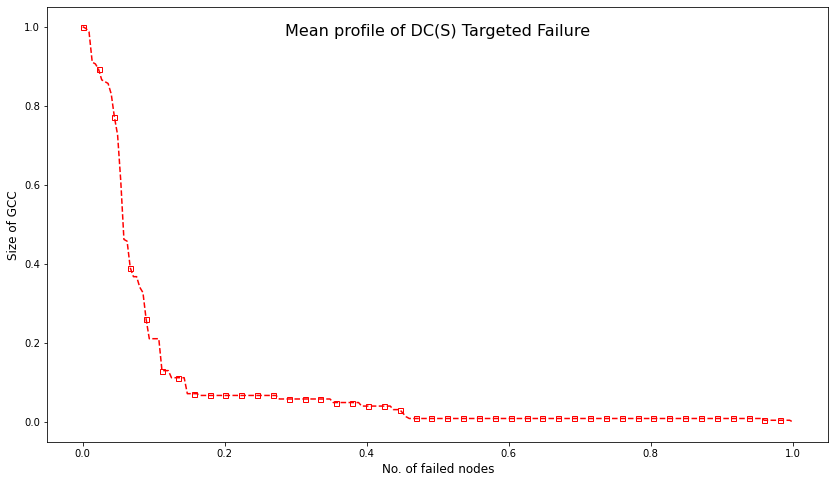

In [55]:
"""Plot Targeted Failure"""
plt.figure(figsize=(14,8))
plt.plot(node_fracf_T_T,gcc_sizes_T_normalized,'r--s', markevery=5, markerfacecolor='none', markersize=5) #Every Iter 2
plt.xlabel('No. of failed nodes', fontsize=12)
plt.ylabel('Size of GCC', fontsize=12)
plt.title('Failure')

plt.title('Mean profile of DC(S) Targeted Failure', y=0.92, fontsize='16')
plt.show()

In [15]:
np.savez(r'G:\My Drive\Ashis_Studies_NU\Nine_URTS_Results\Top_Target\Domirank_C\W_Target_dom.npz',node_fracf_T_W,gcc_sizes_W_normalized)

In [21]:
np.savez(r'G:\My Drive\Ashis_Studies_NU\Nine_URTS_Results\Top_Target\Domirank_C\B_Target_dom.npz',node_fracf_T_B,gcc_sizes_B_normalized)

In [26]:
np.savez(r'G:\My Drive\Ashis_Studies_NU\Nine_URTS_Results\Top_Target\Domirank_C\C_Target_dom.npz',node_fracf_T_C,gcc_sizes_C_normalized)

In [31]:
np.savez(r'G:\My Drive\Ashis_Studies_NU\Nine_URTS_Results\Top_Target\Domirank_C\D_Target_dom.npz',node_fracf_T_D,gcc_sizes_D_normalized)

In [56]:
np.savez(r'G:\My Drive\Ashis_Studies_NU\Nine_URTS_Results\Top_Target\Domirank_C\T_Target_dom.npz',node_fracf_T_T,gcc_sizes_T_normalized)

In [36]:
np.savez(r'G:\My Drive\Ashis_Studies_NU\Nine_URTS_Results\Top_Target\Domirank_C\P_Target_dom.npz',node_fracf_T_P,gcc_sizes_P_normalized)

In [41]:
np.savez(r'G:\My Drive\Ashis_Studies_NU\Nine_URTS_Results\Top_Target\Domirank_C\S_Target_dom.npz',node_fracf_T_S,gcc_sizes_S_normalized)

In [46]:
np.savez(r'G:\My Drive\Ashis_Studies_NU\Nine_URTS_Results\Top_Target\Domirank_C\L_Target_dom.npz',node_fracf_T_L,gcc_sizes_L_normalized)

In [51]:
np.savez(r'G:\My Drive\Ashis_Studies_NU\Nine_URTS_Results\Top_Target\Domirank_C\N_Target_dom.npz',node_fracf_T_N,gcc_sizes_N_normalized)

In [57]:
dr_W=np.load(r'G:\My Drive\Ashis_Studies_NU\Nine_URTS_Results\Top_Target\Domirank_C\W_Target_dom.npz')
# --------------->><<-------------------
dr_B=np.load(r'G:\My Drive\Ashis_Studies_NU\Nine_URTS_Results\Top_Target\Domirank_C\B_Target_dom.npz')
# --------------->><<-------------------
dr_C=np.load(r'G:\My Drive\Ashis_Studies_NU\Nine_URTS_Results\Top_Target\Domirank_C\C_Target_dom.npz')
# --------------->><<-------------------
dr_D=np.load(r'G:\My Drive\Ashis_Studies_NU\Nine_URTS_Results\Top_Target\Domirank_C\D_Target_dom.npz')
# --------------->><<-------------------
dr_T=np.load(r'G:\My Drive\Ashis_Studies_NU\Nine_URTS_Results\Top_Target\Domirank_C\T_Target_dom.npz')
# --------------->><<-------------------
dr_P=np.load(r'G:\My Drive\Ashis_Studies_NU\Nine_URTS_Results\Top_Target\Domirank_C\P_Target_dom.npz')
# --------------->><<-------------------
dr_S=np.load(r'G:\My Drive\Ashis_Studies_NU\Nine_URTS_Results\Top_Target\Domirank_C\S_Target_dom.npz')
# --------------->><<-------------------
dr_L=np.load(r'G:\My Drive\Ashis_Studies_NU\Nine_URTS_Results\Top_Target\Domirank_C\L_Target_dom.npz')
# --------------->><<-------------------
dr_N=np.load(r'G:\My Drive\Ashis_Studies_NU\Nine_URTS_Results\Top_Target\Domirank_C\N_Target_dom.npz')

In [58]:
# calculate the area under the curve
area_W = np.trapz(dr_W['arr_0'],dr_W['arr_1'])
print(abs(area_W))
area_B = np.trapz(dr_B['arr_0'],dr_B['arr_1'])
print(abs(area_B))
area_C = np.trapz(dr_C['arr_0'],dr_C['arr_1'])
print(abs(area_C))
area_D = np.trapz(dr_D['arr_0'],dr_D['arr_1'])
print(abs(area_D))
area_T = np.trapz(dr_T['arr_0'],dr_T['arr_1'])
print(abs(area_T))
area_P = np.trapz(dr_P['arr_0'],dr_P['arr_1'])
print(abs(area_P))
area_S = np.trapz(dr_S['arr_0'],dr_S['arr_1'])
print(abs(area_S))
area_L = np.trapz(dr_L['arr_0'],dr_L['arr_1'])
print(abs(area_L))
area_N = np.trapz(dr_N['arr_0'],dr_N['arr_1'])
print(abs(area_N))

0.08570234113712374
0.07330282227307398
0.055482711732711736
0.07403504617570447
0.09133768417680974
0.06880423141651915
0.07734355365669766
0.06324251080348642
0.047336988902956734


In [2]:
## Normalized URTS Betweenness Centrality
l_W=np.load(r'G:\My Drive\Ashis_Studies_NU\Nine_URTS_Results\Top_Target\Betweenness_C\W_Target_Top.npz')  # Ref
# --------------->><<-------------------
l_B=np.load(r'G:\My Drive\Ashis_Studies_NU\Nine_URTS_Results\Top_Target\Betweenness_C\B_Target_Top.npz')
# --------------->><<-------------------
l_C=np.load(r'G:\My Drive\Ashis_Studies_NU\Nine_URTS_Results\Top_Target\Betweenness_C\C_Target_Top.npz')
# --------------->><<-------------------
l_D=np.load(r'G:\My Drive\Ashis_Studies_NU\Nine_URTS_Results\Top_Target\Betweenness_C\D_Target_Top.npz')
# --------------->><<-------------------
l_T=np.load(r'G:\My Drive\Ashis_Studies_NU\Nine_URTS_Results\Top_Target\Betweenness_C\T_Target_Top.npz')
# --------------->><<-------------------
l_P=np.load(r'G:\My Drive\Ashis_Studies_NU\Nine_URTS_Results\Top_Target\Betweenness_C\P_Target_Top.npz')
# --------------->><<-------------------
l_S=np.load(r'G:\My Drive\Ashis_Studies_NU\Nine_URTS_Results\Top_Target\Betweenness_C\S_Target_Top.npz')
# --------------->><<-------------------
l_L=np.load(r'G:\My Drive\Ashis_Studies_NU\Nine_URTS_Results\Top_Target\Betweenness_C\L_Target_Top.npz')
#---------------->><<--------------------
l_N=np.load(r'G:\My Drive\Ashis_Studies_NU\Nine_URTS_Results\Top_Target\Betweenness_C\N_Target_Top.npz')

## Normalized URTS Closeness Centrality
c_W=np.load(r'G:\My Drive\Ashis_Studies_NU\Nine_URTS_Results\Top_Target\Closeness_C\W_Target_c_Top.npz')  # Ref
# --------------->><<-------------------
c_B=np.load(r'G:\My Drive\Ashis_Studies_NU\Nine_URTS_Results\Top_Target\Closeness_C\B_Target_c_Top.npz')
# --------------->><<-------------------
c_C=np.load(r'G:\My Drive\Ashis_Studies_NU\Nine_URTS_Results\Top_Target\Closeness_C\C_Target_c_Top.npz')
# --------------->><<-------------------
c_D=np.load(r'G:\My Drive\Ashis_Studies_NU\Nine_URTS_Results\Top_Target\Closeness_C\D_Target_c_Top.npz')
# --------------->><<-------------------
c_T=np.load(r'G:\My Drive\Ashis_Studies_NU\Nine_URTS_Results\Top_Target\Closeness_C\T_Target_c_Top.npz')
# --------------->><<-------------------
c_P=np.load(r'G:\My Drive\Ashis_Studies_NU\Nine_URTS_Results\Top_Target\Closeness_C\P_Target_c_Top.npz')
# --------------->><<-------------------
c_S=np.load(r'G:\My Drive\Ashis_Studies_NU\Nine_URTS_Results\Top_Target\Closeness_C\S_Target_c_Top.npz')
# --------------->><<-------------------
c_L=np.load(r'G:\My Drive\Ashis_Studies_NU\Nine_URTS_Results\Top_Target\Closeness_C\L_Target_c_Top.npz')
#---------------->><<--------------------
c_N=np.load(r'G:\My Drive\Ashis_Studies_NU\Nine_URTS_Results\Top_Target\Closeness_C\N_Target_c_Top.npz')

## Normalized URTS Degree Centrality
d_W=np.load(r'G:\My Drive\Ashis_Studies_NU\Nine_URTS_Results\Top_Target\Degree_C\W_Target_d_Top.npz')  # Ref
# --------------->><<-------------------
d_B=np.load(r'G:\My Drive\Ashis_Studies_NU\Nine_URTS_Results\Top_Target\Degree_C\B_Target_d_Top.npz')
# --------------->><<-------------------
d_C=np.load(r'G:\My Drive\Ashis_Studies_NU\Nine_URTS_Results\Top_Target\Degree_C\C_Target_d_Top.npz')
# --------------->><<-------------------
d_D=np.load(r'G:\My Drive\Ashis_Studies_NU\Nine_URTS_Results\Top_Target\Degree_C\D_Target_d_Top.npz')
# --------------->><<-------------------
d_T=np.load(r'G:\My Drive\Ashis_Studies_NU\Nine_URTS_Results\Top_Target\Degree_C\T_Target_d_Top.npz')
# --------------->><<-------------------
d_P=np.load(r'G:\My Drive\Ashis_Studies_NU\Nine_URTS_Results\Top_Target\Degree_C\P_Target_d_Top.npz')
# --------------->><<-------------------
d_S=np.load(r'G:\My Drive\Ashis_Studies_NU\Nine_URTS_Results\Top_Target\Degree_C\S_Target_d_Top.npz')
# --------------->><<-------------------
d_L=np.load(r'G:\My Drive\Ashis_Studies_NU\Nine_URTS_Results\Top_Target\Degree_C\L_Target_d_Top.npz')
#---------------->><<--------------------
d_N=np.load(r'G:\My Drive\Ashis_Studies_NU\Nine_URTS_Results\Top_Target\Degree_C\N_Target_d_Top.npz')

## Normalized URTS Eigenvector Centrality
e_W=np.load(r'G:\My Drive\Ashis_Studies_NU\Nine_URTS_Results\Top_Target\Eigenvector_C\W_Target_e_Top.npz')  # Ref
# --------------->><<-------------------
e_B=np.load(r'G:\My Drive\Ashis_Studies_NU\Nine_URTS_Results\Top_Target\Eigenvector_C\B_Target_e_Top.npz')
# --------------->><<-------------------
e_C=np.load(r'G:\My Drive\Ashis_Studies_NU\Nine_URTS_Results\Top_Target\Eigenvector_C\C_Target_e_Top.npz')
# --------------->><<-------------------
e_D=np.load(r'G:\My Drive\Ashis_Studies_NU\Nine_URTS_Results\Top_Target\Eigenvector_C\D_Target_e_Top.npz')
# --------------->><<-------------------
e_T=np.load(r'G:\My Drive\Ashis_Studies_NU\Nine_URTS_Results\Top_Target\Eigenvector_C\T_Target_e_Top.npz')
# --------------->><<-------------------
e_P=np.load(r'G:\My Drive\Ashis_Studies_NU\Nine_URTS_Results\Top_Target\Eigenvector_C\P_Target_e_Top.npz')
# --------------->><<-------------------
e_S=np.load(r'G:\My Drive\Ashis_Studies_NU\Nine_URTS_Results\Top_Target\Eigenvector_C\S_Target_e_Top.npz')
# --------------->><<-------------------
e_L=np.load(r'G:\My Drive\Ashis_Studies_NU\Nine_URTS_Results\Top_Target\Eigenvector_C\L_Target_e_Top.npz')
#---------------->><<--------------------
e_N=np.load(r'G:\My Drive\Ashis_Studies_NU\Nine_URTS_Results\Top_Target\Eigenvector_C\N_Target_e_Top.npz')

## Normalized URTS Domirank Centrality
dr_W=np.load(r'G:\My Drive\Ashis_Studies_NU\Nine_URTS_Results\Top_Target\Domirank_C\W_Target_dom.npz')
# --------------->><<-------------------
dr_B=np.load(r'G:\My Drive\Ashis_Studies_NU\Nine_URTS_Results\Top_Target\Domirank_C\B_Target_dom.npz')
# --------------->><<-------------------
dr_C=np.load(r'G:\My Drive\Ashis_Studies_NU\Nine_URTS_Results\Top_Target\Domirank_C\C_Target_dom.npz')
# --------------->><<-------------------
dr_D=np.load(r'G:\My Drive\Ashis_Studies_NU\Nine_URTS_Results\Top_Target\Domirank_C\D_Target_dom.npz')
# --------------->><<-------------------
dr_T=np.load(r'G:\My Drive\Ashis_Studies_NU\Nine_URTS_Results\Top_Target\Domirank_C\T_Target_dom.npz')
# --------------->><<-------------------
dr_P=np.load(r'G:\My Drive\Ashis_Studies_NU\Nine_URTS_Results\Top_Target\Domirank_C\P_Target_dom.npz')
# --------------->><<-------------------
dr_S=np.load(r'G:\My Drive\Ashis_Studies_NU\Nine_URTS_Results\Top_Target\Domirank_C\S_Target_dom.npz')
# --------------->><<-------------------
dr_L=np.load(r'G:\My Drive\Ashis_Studies_NU\Nine_URTS_Results\Top_Target\Domirank_C\L_Target_dom.npz')
# --------------->><<-------------------
dr_N=np.load(r'G:\My Drive\Ashis_Studies_NU\Nine_URTS_Results\Top_Target\Domirank_C\N_Target_dom.npz')

## Normalized FLood

f_W = np.load(r'G:\My Drive\Ashis_Studies_NU\Nine_URTS_Results\Top_Flood\W_Flood_Top.npz')
# --------------->><<-------------------
f_B = np.load(r'G:\My Drive\Ashis_Studies_NU\Nine_URTS_Results\Top_Flood\B_Flood_Top.npz')
# --------------->><<-------------------
f_C = np.load(r'G:\My Drive\Ashis_Studies_NU\Nine_URTS_Results\Top_Flood\C_Flood_Top.npz')
# --------------->><<-------------------
f_D = np.load(r'G:\My Drive\Ashis_Studies_NU\Nine_URTS_Results\Top_Flood\D_Flood_Top.npz')
# --------------->><<-------------------
f_T = np.load(r'G:\My Drive\Ashis_Studies_NU\Nine_URTS_Results\Top_Flood\T_Flood_Top.npz')
# --------------->><<-------------------
f_P = np.load(r'G:\My Drive\Ashis_Studies_NU\Nine_URTS_Results\Top_Flood\P_Flood_Top.npz')
# --------------->><<-------------------
f_S = np.load(r'G:\My Drive\Ashis_Studies_NU\Nine_URTS_Results\Top_Flood\S_Flood_Top.npz')
# --------------->><<-------------------
f_L = np.load(r'G:\My Drive\Ashis_Studies_NU\Nine_URTS_Results\Top_Flood\L_Flood_Top.npz')
# --------------->><<-------------------
f_N = np.load(r'G:\My Drive\Ashis_Studies_NU\Nine_URTS_Results\Top_Flood\N_Flood_Top.npz')

## Normalized Random URTS
r_W=np.load(r'G:\My Drive\Ashis_Studies_NU\Nine_URTS_Results\Top_Random\W_Random_Top.npz')  # Ref
# --------------->><<-------------------
r_B=np.load(r'G:\My Drive\Ashis_Studies_NU\Nine_URTS_Results\Top_Random\B_Random_Top.npz')
# --------------->><<-------------------
r_C=np.load(r'G:\My Drive\Ashis_Studies_NU\Nine_URTS_Results\Top_Random\C_Random_Top.npz')
# --------------->><<-------------------
r_D=np.load(r'G:\My Drive\Ashis_Studies_NU\Nine_URTS_Results\Top_Random\D_Random_Top.npz')
# --------------->><<-------------------
r_T=np.load(r'G:\My Drive\Ashis_Studies_NU\Nine_URTS_Results\Top_Random\T_Random_Top.npz')
# --------------->><<-------------------
r_P=np.load(r'G:\My Drive\Ashis_Studies_NU\Nine_URTS_Results\Top_Random\P_Random_Top.npz')
# --------------->><<-------------------
r_S=np.load(r'G:\My Drive\Ashis_Studies_NU\Nine_URTS_Results\Top_Random\S_Random_Top.npz')
# --------------->><<-------------------
r_L=np.load(r'G:\My Drive\Ashis_Studies_NU\Nine_URTS_Results\Top_Random\L_Random_Top.npz')
#---------------->><<--------------------
r_N=np.load(r'G:\My Drive\Ashis_Studies_NU\Nine_URTS_Results\Top_Random\N_Random_Top.npz')


In [5]:
fig, ax = plt.subplots(nrows=3, ncols=3, sharex=False, sharey=False, figsize=[25, 20],dpi=600)
# Adjust subplot spacing
plt.subplots_adjust(wspace=0.2, hspace=0.2)

colors = ['crimson', 'teal', 'green','indigo', 'dodgerblue', 'fuchsia']
Q = 2  # Assuming Q is your linewidth
marker_style = ['s', '*', 'o', 'p', 'D', 'x', '|']
labelsize = 25
fontsize = 25


plt.subplot(ax[0, 0]).plot(dr_W['arr_0'], dr_W['arr_1'], color=colors[-1], linestyle='-', marker=marker_style[-1], label='Domirank', markevery=15, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[0, 0]).plot(l_W['arr_0'], l_W['arr_1'], color=colors[0], linestyle='-', marker=marker_style[0], label='Betweenness', markevery=15, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[0, 0]).plot(c_W['arr_0'], c_W['arr_1'], color=colors[1], linestyle='-', marker=marker_style[1], label='Closeness', markevery=15, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[0, 0]).plot(d_W['arr_0'], d_W['arr_1'], color=colors[2], linestyle='-', marker=marker_style[2], label='Degree', markevery=15, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[0, 0]).plot(e_W['arr_0'], e_W['arr_1'], color=colors[3], linestyle='-', marker=marker_style[3], label='Eigenvector', markevery=15, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[0, 0]).plot(r_W['arr_0'], r_W['arr_1'], color=colors[4], linestyle='-', marker=marker_style[4], label='Random', markevery=15, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[0, 0]).plot(f_W['arr_0'], f_W['arr_1'], color=colors[5], linestyle='-', marker=marker_style[5], label='Flooding', markevery=15, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[0, 0]).legend(fontsize=20)
plt.subplot(ax[0, 0]).tick_params(axis='both', labelsize=labelsize)
plt.subplot(ax[0, 0]).set_title('Washington DC (N=91, E=93)', fontsize=25, fontweight='bold')


# --------------->><<-------------------
plt.subplot(ax[0, 1]).plot(dr_B['arr_0'],dr_B['arr_1'],color=colors[-1], linestyle='-', marker=marker_style[-1], label='Domirank',markevery=15, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[0, 1]).plot(l_B['arr_0'],l_B['arr_1'],color=colors[0], linestyle='-', marker=marker_style[0], label='Betweenness Centrality',markevery=15, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[0, 1]).plot(c_B['arr_0'],c_B['arr_1'],color=colors[1], linestyle='-', marker=marker_style[1], label='Closeness Centrality',markevery=15, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[0, 1]).plot(d_B['arr_0'],d_B['arr_1'],color=colors[2], linestyle='-', marker=marker_style[2], label='Degree Centrality',markevery=15, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[0, 1]).plot(e_B['arr_0'],e_B['arr_1'],color=colors[3], linestyle='-', marker=marker_style[3], label='Eigenvector Centrality',markevery=15, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[0, 1]).plot(r_B['arr_0'],r_B['arr_1'],color=colors[4], linestyle='-', marker=marker_style[4], label='Random Recovery',markevery=15, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[0, 1]).plot(f_B['arr_0'],f_B['arr_1'], color=colors[5], linestyle='-', marker=marker_style[5], label='Flooding', markevery=15, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[0, 1]).legend(fontsize=20)
plt.subplot(ax[0, 1]).tick_params(axis='both', labelsize=labelsize)
plt.subplot(ax[0, 1]).set_title('Boston (N=114, E=115)', fontsize=fontsize, fontweight='bold')


# --------------->><<-------------------
plt.subplot(ax[0, 2]).plot(dr_C['arr_0'],dr_C['arr_1'],color=colors[-1], linestyle='-', marker=marker_style[-1], label='Domirank Centrality',markevery=15, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[0, 2]).plot(l_C['arr_0'],l_C['arr_1'],color=colors[0], linestyle='-', marker=marker_style[0], label='Betweenness Centrality',markevery=15, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[0, 2]).plot(c_C['arr_0'],c_C['arr_1'],color=colors[1], linestyle='-', marker=marker_style[1], label='Closeness Centrality',markevery=15, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[0, 2]).plot(d_C['arr_0'],d_C['arr_1'],color=colors[2], linestyle='-', marker=marker_style[2], label='Degree Centrality',markevery=15, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[0, 2]).plot(e_C['arr_0'],e_C['arr_1'],color=colors[3], linestyle='-', marker=marker_style[3], label='Eigenvector Centrality',markevery=15, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[0, 2]).plot(r_C['arr_0'],r_C['arr_1'],color=colors[4], linestyle='-', marker=marker_style[4], label='Random Recovery',markevery=15, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[0, 2]).plot(f_C['arr_0'],f_C['arr_1'], color=colors[5], linestyle='-', marker=marker_style[5], label='Flooding', markevery=15, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[0, 2]).legend(fontsize=20)
plt.subplot(ax[0, 2]).tick_params(axis='both', labelsize=labelsize)
plt.subplot(ax[0, 2]).set_title('Chicago (N=143, E=149)', fontsize=fontsize, fontweight='bold')


# --------------->><<-------------------
plt.subplot(ax[1, 0]).plot(dr_D['arr_0'],dr_D['arr_1'],color=colors[-1], linestyle='-', marker=marker_style[-1], label='Domirank Centrality',markevery=15, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[1, 0]).plot(l_D['arr_0'],l_D['arr_1'],color=colors[0], linestyle='-', marker=marker_style[0], label='Betweenness Centrality',markevery=15, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[1, 0]).plot(c_D['arr_0'],c_D['arr_1'],color=colors[1], linestyle='-', marker=marker_style[1], label='Closeness Centrality',markevery=15, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[1, 0]).plot(d_D['arr_0'],d_D['arr_1'],color=colors[2], linestyle='-', marker=marker_style[2], label='Degree Centrality',markevery=15, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[1, 0]).plot(e_D['arr_0'],e_D['arr_1'],color=colors[3], linestyle='-', marker=marker_style[3], label='Eigenvector Centrality',markevery=15, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[1, 0]).plot(r_D['arr_0'],r_D['arr_1'],color=colors[4], linestyle='-', marker=marker_style[4], label='Random Recovery',markevery=15, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[1, 0]).plot(f_D['arr_0'],f_D['arr_1'], color=colors[5], linestyle='-', marker=marker_style[5], label='Flooding', markevery=15, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[1, 0]).legend(fontsize=20)
plt.subplot(ax[1, 0]).tick_params(axis='both', labelsize=labelsize)
plt.subplot(ax[1, 0]).set_title('Delhi (N=205, E=216)', fontsize=fontsize, fontweight='bold')

# --------------->><<-------------------
plt.subplot(ax[1, 1]).plot(dr_T['arr_0'],dr_T['arr_1'],color=colors[-1], linestyle='-', marker=marker_style[-1], label='Domirank Centrality',markevery=15, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[1, 1]).plot(l_T['arr_0'],l_T['arr_1'],color=colors[0], linestyle='-', marker=marker_style[0], label='Betweenness Centrality',markevery=15, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[1, 1]).plot(c_T['arr_0'],c_T['arr_1'],color=colors[1], linestyle='-', marker=marker_style[1], label='Closeness Centrality',markevery=15, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[1, 1]).plot(d_T['arr_0'],d_T['arr_1'],color=colors[2], linestyle='-', marker=marker_style[2], label='Degree Centrality',markevery=15, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[1, 1]).plot(e_T['arr_0'],e_T['arr_1'],color=colors[3], linestyle='-', marker=marker_style[3], label='Eigenvector Centrality',markevery=15, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[1, 1]).plot(r_T['arr_0'],r_T['arr_1'],color=colors[4], linestyle='-', marker=marker_style[4], label='Random Recovery',markevery=15, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[1, 1]).plot(f_T['arr_0'],f_T['arr_1'], color=colors[5], linestyle='-', marker=marker_style[5], label='Flooding', markevery=15, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[1, 1]).legend(fontsize=20)
plt.subplot(ax[1, 1]).tick_params(axis='both', labelsize=labelsize)
plt.subplot(ax[1, 1]).set_title('Tokyo (N=223, E=268)', fontsize=fontsize, fontweight='bold')

# --------------->><<-------------------
plt.subplot(ax[1, 2]).plot(dr_P['arr_0'],dr_P['arr_1'],color=colors[-1], linestyle='-', marker=marker_style[-1], label='Domirank Centrality',markevery=30, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[1, 2]).plot(l_P['arr_0'],l_P['arr_1'],color=colors[0], linestyle='-', marker=marker_style[0], label='Betweenness Centrality',markevery=30, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[1, 2]).plot(c_P['arr_0'],c_P['arr_1'],color=colors[1], linestyle='-', marker=marker_style[1], label='Closeness Centrality',markevery=30, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[1, 2]).plot(d_P['arr_0'],d_P['arr_1'],color=colors[2], linestyle='-', marker=marker_style[2], label='Degree Centrality',markevery=30, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[1, 2]).plot(e_P['arr_0'],e_P['arr_1'],color=colors[3], linestyle='-', marker=marker_style[3], label='Eigenvector Centrality',markevery=30, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[1, 2]).plot(r_P['arr_0'],r_P['arr_1'],color=colors[4], linestyle='-', marker=marker_style[4], label='Random Recovery',markevery=30, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[1, 2]).plot(f_P['arr_0'],f_P['arr_1'], color=colors[5], linestyle='-', marker=marker_style[5], label='Flooding', markevery=15, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[1, 2]).legend(fontsize=20)
plt.subplot(ax[1, 2]).tick_params(axis='both', labelsize=labelsize)
plt.subplot(ax[1, 2]).set_title('Paris (N=302, E=358)', fontsize=fontsize, fontweight='bold')

# --------------->><<-------------------
plt.subplot(ax[2, 0]).plot(dr_S['arr_0'],dr_S['arr_1'],color=colors[-1], linestyle='-', marker=marker_style[-1], label='Domirank Centrality',markevery=30, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[2, 0]).plot(l_S['arr_0'],l_S['arr_1'],color=colors[0], linestyle='-', marker=marker_style[0], label='Betweenness Centrality',markevery=30, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[2, 0]).plot(c_S['arr_0'],c_S['arr_1'],color=colors[1], linestyle='-', marker=marker_style[1], label='Closeness Centrality',markevery=30, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[2, 0]).plot(d_S['arr_0'],d_S['arr_1'],color=colors[2], linestyle='-', marker=marker_style[2], label='Degree Centrality',markevery=30, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[2, 0]).plot(e_S['arr_0'],e_S['arr_1'],color=colors[3], linestyle='-', marker=marker_style[3], label='Eigenvector Centrality',markevery=30, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[2, 0]).plot(r_S['arr_0'],r_S['arr_1'],color=colors[4], linestyle='-', marker=marker_style[4], label='Random Recovery',markevery=30, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[2, 0]).plot(f_S['arr_0'],f_S['arr_1'], color=colors[5], linestyle='-', marker=marker_style[5], label='Flooding', markevery=15, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[2, 0]).legend(fontsize=20)
plt.subplot(ax[2, 0]).tick_params(axis='both', labelsize=labelsize)
plt.subplot(ax[2, 0]).set_title('Shanghai (N=345, E=397)', fontsize=fontsize, fontweight='bold')


# --------------->><<-------------------
plt.subplot(ax[2, 1]).plot(dr_L['arr_0'],dr_L['arr_1'],color=colors[-1], linestyle='-', marker=marker_style[-1], label='Domirank Centrality',markevery=30, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[2, 1]).plot(l_L['arr_0'],l_L['arr_1'],color=colors[0], linestyle='-', marker=marker_style[0], label='Betweenness Centrality',markevery=30, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[2, 1]).plot(c_L['arr_0'],c_L['arr_1'],color=colors[1], linestyle='-', marker=marker_style[1], label='Closeness Centrality',markevery=30, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[2, 1]).plot(d_L['arr_0'],d_L['arr_1'],color=colors[2], linestyle='-', marker=marker_style[2], label='Degree Centrality',markevery=30, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[2, 1]).plot(e_L['arr_0'],e_L['arr_1'],color=colors[3], linestyle='-', marker=marker_style[3], label='Eigenvector Centrality',markevery=30, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[2, 1]).plot(r_L['arr_0'],r_L['arr_1'],color=colors[4], linestyle='-', marker=marker_style[4], label='Random Recovery',markevery=30, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[2, 1]).plot(f_L['arr_0'],f_L['arr_1'], color=colors[5], linestyle='-', marker=marker_style[5], label='Flooding', markevery=15, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[2, 1]).legend(fontsize=20)
plt.subplot(ax[2, 1]).tick_params(axis='both', labelsize=labelsize)
plt.subplot(ax[2, 1]).set_title('London (N=369, E=430)', fontsize=fontsize, fontweight='bold')

# --------------->><<-------------------
plt.subplot(ax[2, 2]).plot(dr_N['arr_0'],dr_N['arr_1'],color=colors[-1], linestyle='-', marker=marker_style[-1], label='Domirank Centrality',markevery=30, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[2, 2]).plot(l_N['arr_0'],l_N['arr_1'],color=colors[0], linestyle='-', marker=marker_style[0], label='Betweenness Centrality',markevery=30, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[2, 2]).plot(c_N['arr_0'],c_N['arr_1'],color=colors[1], linestyle='-', marker=marker_style[1], label='Closeness Centrality',markevery=30, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[2, 2]).plot(d_N['arr_0'],d_N['arr_1'],color=colors[2], linestyle='-', marker=marker_style[2], label='Degree Centrality',markevery=30, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[2, 2]).plot(e_N['arr_0'],e_N['arr_1'],color=colors[3], linestyle='-', marker=marker_style[3], label='Eigenvector Centrality',markevery=30, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[2, 2]).plot(r_N['arr_0'],r_N['arr_1'],color=colors[4], linestyle='-', marker=marker_style[4], label='Random Recovery',markevery=30, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[2, 2]).plot(f_N['arr_0'], f_N['arr_1'], color=colors[5], linestyle='-', marker=marker_style[5], label='Flooding', markevery=15, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[2, 2]).legend(fontsize=20)
plt.subplot(ax[2, 2]).tick_params(axis='both', labelsize=labelsize)
plt.subplot(ax[2, 2]).set_title('New York (N=463, E=510)', fontsize=fontsize, fontweight='bold')


# --------------->><<-------------------

plt.tight_layout()
# plt.savefig(r'G:\My Drive\Ashis_Studies_NU\Nine_URTS_Results\Failure\Failure_9_Dr.jpg')
plt.show()




In [6]:
fig, ax = plt.subplots(nrows=3, ncols=3, sharex=False, sharey=False, figsize=[20, 18],dpi=600)
# Adjust subplot spacing
plt.subplots_adjust(wspace=0.1, hspace=0.15)

colors = ['crimson', 'teal', 'green','indigo', 'dodgerblue', 'fuchsia']
Q = 2  # Assuming Q is your linewidth
marker_style = ['s', '*', 'o', 'p', 'D', 'x', '|']
labelsize = 20
fontsize = 20


plt.subplot(ax[0, 0]).plot(dr_W['arr_0'], dr_W['arr_1'], color=colors[-1], linestyle='-', marker=marker_style[-1], label=r'$A_{\mathrm{DMC}} = 0.09$', markevery=15, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[0, 0]).plot(l_W['arr_0'], l_W['arr_1'], color=colors[0], linestyle='-', marker=marker_style[0], label=r'$A_{\mathrm{BC}} = 0.10$', markevery=15, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[0, 0]).plot(c_W['arr_0'], c_W['arr_1'], color=colors[1], linestyle='-', marker=marker_style[1], label=r'$A_{\mathrm{CC}} = 0.14$', markevery=15, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[0, 0]).plot(d_W['arr_0'], d_W['arr_1'], color=colors[2], linestyle='-', marker=marker_style[2], label=r'$A_{\mathrm{DGC}} = 0.10$', markevery=15, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[0, 0]).plot(e_W['arr_0'], e_W['arr_1'], color=colors[3], linestyle='-', marker=marker_style[3], label=r'$A_{\mathrm{EVC}} = 0.14$', markevery=15, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[0, 0]).plot(r_W['arr_0'], r_W['arr_1'], color=colors[4], linestyle='-', marker=marker_style[4], label=r'$F_{\mathrm{R}} = 0.19$', markevery=15, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[0, 0]).plot(f_W['arr_0'], f_W['arr_1'], color=colors[5], linestyle='-', marker=marker_style[5], label=r'$F_{\mathrm{F}} = 0.22$', markevery=15, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[0, 0]).legend(fontsize=20)
# plt.subplot(ax[0, 0]).spines['right'].set_visible(False)
# plt.subplot(ax[0, 0]).spines['top'].set_visible(False)
plt.subplot(ax[0, 0]).tick_params(axis='both', labelsize=labelsize)
# plt.subplot(ax[0, 0]).tick_params(axis='x', bottom=False, labelbottom=False)
plt.subplot(ax[0, 0]).tick_params(axis='x', which='both', bottom=True, top=False, labelbottom=False)
plt.subplot(ax[0, 0]).set_xticks(np.linspace(plt.subplot(ax[0, 0]).get_xlim()[0], plt.subplot(ax[0, 0]).get_xlim()[1], 6))
plt.subplot(ax[0, 0]).set_title('Washington DC (N=91, E=93)', fontsize=fontsize, fontweight='bold')


# --------------->><<-------------------
plt.subplot(ax[0, 1]).plot(dr_B['arr_0'],dr_B['arr_1'],color=colors[-1], linestyle='-', marker=marker_style[-1], label=r'$A_{\mathrm{DMC}} = 0.07$',markevery=15, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[0, 1]).plot(l_B['arr_0'],l_B['arr_1'],color=colors[0], linestyle='-', marker=marker_style[0], label=r'$A_{\mathrm{BC}} = 0.09$',markevery=15, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[0, 1]).plot(c_B['arr_0'],c_B['arr_1'],color=colors[1], linestyle='-', marker=marker_style[1], label=r'$A_{\mathrm{CC}} = 0.12$',markevery=15, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[0, 1]).plot(d_B['arr_0'],d_B['arr_1'],color=colors[2], linestyle='-', marker=marker_style[2], label=r'$A_{\mathrm{DGC}} = 0.13$',markevery=15, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[0, 1]).plot(e_B['arr_0'],e_B['arr_1'],color=colors[3], linestyle='-', marker=marker_style[3], label=r'$A_{\mathrm{EVC}} = 0.22$',markevery=15, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[0, 1]).plot(r_B['arr_0'],r_B['arr_1'],color=colors[4], linestyle='-', marker=marker_style[4], label=r'$F_{\mathrm{R}} = 0.15$',markevery=15, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[0, 1]).plot(f_B['arr_0'],f_B['arr_1'], color=colors[5], linestyle='-', marker=marker_style[5], label=r'$F_{\mathrm{F}} = 0.20$', markevery=15, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[0, 1]).legend(fontsize=20)
# plt.subplot(ax[0, 1]).spines['right'].set_visible(False)
# plt.subplot(ax[0, 1]).spines['top'].set_visible(False)
# plt.subplot(ax[0, 1]).tick_params(axis='both', labelsize=labelsize)
# plt.subplot(ax[0, 1]).tick_params(axis='x', bottom=False, labelbottom=False)
plt.subplot(ax[0, 1]).tick_params(axis='x', which='both', bottom=True, top=False, labelbottom=False)
plt.subplot(ax[0, 1]).tick_params(axis='y', which='both', left=True, right=False, labelleft=False)
# Setting major ticks to appear at specific intervals
plt.subplot(ax[0, 1]).set_xticks(np.linspace(plt.subplot(ax[0, 1]).get_xlim()[0], plt.subplot(ax[0, 1]).get_xlim()[1], 6))
plt.subplot(ax[0, 1]).set_yticks(np.linspace(plt.subplot(ax[0, 1]).get_ylim()[0], plt.subplot(ax[0, 1]).get_ylim()[1], 6))
plt.subplot(ax[0, 1]).set_title('Boston (N=114, E=115)', fontsize=fontsize, fontweight='bold')


# --------------->><<-------------------
plt.subplot(ax[0, 2]).plot(dr_C['arr_0'],dr_C['arr_1'],color=colors[-1], linestyle='-', marker=marker_style[-1], label=r'$A_{\mathrm{DMC}} = 0.06$',markevery=15, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[0, 2]).plot(l_C['arr_0'],l_C['arr_1'],color=colors[0], linestyle='-', marker=marker_style[0], label=r'$A_{\mathrm{BC}} = 0.08$',markevery=15, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[0, 2]).plot(c_C['arr_0'],c_C['arr_1'],color=colors[1], linestyle='-', marker=marker_style[1], label=r'$A_{\mathrm{CC}} = 0.18$',markevery=15, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[0, 2]).plot(d_C['arr_0'],d_C['arr_1'],color=colors[2], linestyle='-', marker=marker_style[2], label=r'$A_{\mathrm{DGC}} = 0.10$',markevery=15, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[0, 2]).plot(e_C['arr_0'],e_C['arr_1'],color=colors[3], linestyle='-', marker=marker_style[3], label=r'$A_{\mathrm{EVC}} = 0.21$',markevery=15, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[0, 2]).plot(r_C['arr_0'],r_C['arr_1'],color=colors[4], linestyle='-', marker=marker_style[4], label=r'$F_{\mathrm{R}} = 0.14$',markevery=15, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[0, 2]).plot(f_C['arr_0'],f_C['arr_1'], color=colors[5], linestyle='-', marker=marker_style[5], label=r'$F_{\mathrm{F}} = 0.11$', markevery=15, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[0, 2]).legend(fontsize=20)
# plt.subplot(ax[0, 2]).spines['right'].set_visible(False)
# plt.subplot(ax[0, 2]).spines['top'].set_visible(False)
# plt.subplot(ax[0, 2]).tick_params(axis='both', labelsize=labelsize)
# plt.subplot(ax[0, 2]).tick_params(axis='x', bottom=False, labelbottom=False)
plt.subplot(ax[0, 2]).tick_params(axis='x', which='both', bottom=True, top=False, labelbottom=False)
plt.subplot(ax[0, 2]).tick_params(axis='y', which='both', left=True, right=False, labelleft=False)
# Setting major ticks to appear at specific intervals
plt.subplot(ax[0, 2]).set_xticks(np.linspace(plt.subplot(ax[0, 2]).get_xlim()[0], plt.subplot(ax[0, 2]).get_xlim()[1], 6))
plt.subplot(ax[0, 2]).set_yticks(np.linspace(plt.subplot(ax[0, 2]).get_ylim()[0], plt.subplot(ax[0, 2]).get_ylim()[1], 6))
plt.subplot(ax[0, 2]).set_title('Chicago (N=143, E=149)', fontsize=fontsize, fontweight='bold')


# --------------->><<-------------------
plt.subplot(ax[1, 0]).plot(dr_D['arr_0'],dr_D['arr_1'],color=colors[-1], linestyle='-', marker=marker_style[-1], label=r'$A_{\mathrm{DMC}} = 0.07$',markevery=15, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[1, 0]).plot(l_D['arr_0'],l_D['arr_1'],color=colors[0], linestyle='-', marker=marker_style[0], label=r'$A_{\mathrm{BC}} = 0.11$',markevery=15, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[1, 0]).plot(c_D['arr_0'],c_D['arr_1'],color=colors[1], linestyle='-', marker=marker_style[1], label=r'$A_{\mathrm{CC}} = 0.24$',markevery=15, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[1, 0]).plot(d_D['arr_0'],d_D['arr_1'],color=colors[2], linestyle='-', marker=marker_style[2], label=r'$A_{\mathrm{DGC}} = 0.10$',markevery=15, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[1, 0]).plot(e_D['arr_0'],e_D['arr_1'],color=colors[3], linestyle='-', marker=marker_style[3], label=r'$A_{\mathrm{EVC}} = 0.29$',markevery=15, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[1, 0]).plot(r_D['arr_0'],r_D['arr_1'],color=colors[4], linestyle='-', marker=marker_style[4], label=r'$F_{\mathrm{R}} = 0.16$',markevery=15, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[1, 0]).plot(f_D['arr_0'],f_D['arr_1'], color=colors[5], linestyle='-', marker=marker_style[5], label=r'$F_{\mathrm{F}} = 0.17$', markevery=15, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[1, 0]).legend(fontsize=20)
# plt.subplot(ax[1, 0]).spines['right'].set_visible(False)
# plt.subplot(ax[1, 0]).spines['top'].set_visible(False)
plt.subplot(ax[1, 0]).tick_params(axis='both', labelsize=labelsize)
plt.subplot(ax[1, 0]).tick_params(axis='x', bottom=False, labelbottom=False)
plt.subplot(ax[1, 0]).set_title('Delhi (N=205, E=216)', fontsize=fontsize, fontweight='bold')

# --------------->><<-------------------
plt.subplot(ax[1, 1]).plot(dr_T['arr_0'],dr_T['arr_1'],color=colors[-1], linestyle='-', marker=marker_style[-1], label=r'$A_{\mathrm{DMC}} = 0.09$',markevery=15, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[1, 1]).plot(l_T['arr_0'],l_T['arr_1'],color=colors[0], linestyle='-', marker=marker_style[0], label=r'$A_{\mathrm{BC}} = 0.12$',markevery=15, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[1, 1]).plot(c_T['arr_0'],c_T['arr_1'],color=colors[1], linestyle='-', marker=marker_style[1], label=r'$A_{\mathrm{CC}} = 0.21$',markevery=15, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[1, 1]).plot(d_T['arr_0'],d_T['arr_1'],color=colors[2], linestyle='-', marker=marker_style[2], label=r'$A_{\mathrm{DGC}} = 0.11$',markevery=15, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[1, 1]).plot(e_T['arr_0'],e_T['arr_1'],color=colors[3], linestyle='-', marker=marker_style[3], label=r'$A_{\mathrm{EVC}} = 0.22$',markevery=15, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[1, 1]).plot(r_T['arr_0'],r_T['arr_1'],color=colors[4], linestyle='-', marker=marker_style[4], label=r'$F_{\mathrm{R}} = 0.25$',markevery=15, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[1, 1]).plot(f_T['arr_0'],f_T['arr_1'], color=colors[5], linestyle='-', marker=marker_style[5], label=r'$F_{\mathrm{F}} = 0.22$', markevery=15, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[1, 1]).legend(fontsize=20)
# plt.subplot(ax[1, 1]).spines['right'].set_visible(False)
# plt.subplot(ax[1, 1]).spines['top'].set_visible(False)
# plt.subplot(ax[1, 1]).tick_params(axis='both', labelsize=labelsize)
# plt.subplot(ax[1, 1]).tick_params(axis='x', bottom=False, labelbottom=False)
plt.subplot(ax[1, 1]).tick_params(axis='x', which='both', bottom=True, top=False, labelbottom=False)
plt.subplot(ax[1, 1]).tick_params(axis='y', which='both', left=True, right=False, labelleft=False)
# Setting major ticks to appear at specific intervals
plt.subplot(ax[1, 1]).set_xticks(np.linspace(plt.subplot(ax[1, 1]).get_xlim()[0], plt.subplot(ax[1, 1]).get_xlim()[1], 6))
plt.subplot(ax[1, 1]).set_yticks(np.linspace(plt.subplot(ax[1, 1]).get_ylim()[0], plt.subplot(ax[1, 1]).get_ylim()[1], 6))
plt.subplot(ax[1, 1]).set_title('Tokyo (N=223, E=268)', fontsize=fontsize, fontweight='bold')

# --------------->><<-------------------
plt.subplot(ax[1, 2]).plot(dr_P['arr_0'],dr_P['arr_1'],color=colors[-1], linestyle='-', marker=marker_style[-1], label=r'$A_{\mathrm{DMC}} = 0.07$',markevery=30, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[1, 2]).plot(l_P['arr_0'],l_P['arr_1'],color=colors[0], linestyle='-', marker=marker_style[0], label=r'$A_{\mathrm{BC}} = 0.09$',markevery=30, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[1, 2]).plot(c_P['arr_0'],c_P['arr_1'],color=colors[1], linestyle='-', marker=marker_style[1], label=r'$A_{\mathrm{CC}} = 0.23$',markevery=30, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[1, 2]).plot(d_P['arr_0'],d_P['arr_1'],color=colors[2], linestyle='-', marker=marker_style[2], label=r'$A_{\mathrm{DGC}} = 0.08$',markevery=30, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[1, 2]).plot(e_P['arr_0'],e_P['arr_1'],color=colors[3], linestyle='-', marker=marker_style[3], label=r'$A_{\mathrm{EVC}} = 0.23$',markevery=30, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[1, 2]).plot(r_P['arr_0'],r_P['arr_1'],color=colors[4], linestyle='-', marker=marker_style[4], label=r'$F_{\mathrm{R}} = 0.22$',markevery=30, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[1, 2]).plot(f_P['arr_0'],f_P['arr_1'], color=colors[5], linestyle='-', marker=marker_style[5], label=r'$F_{\mathrm{F}} = 0.21$', markevery=15, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[1, 2]).legend(fontsize=20)
# plt.subplot(ax[1, 2]).spines['right'].set_visible(False)
# plt.subplot(ax[1, 2]).spines['top'].set_visible(False)
# plt.subplot(ax[1, 2]).tick_params(axis='both', labelsize=labelsize)
# plt.subplot(ax[1, 2]).tick_params(axis='x', bottom=False, labelbottom=False)
plt.subplot(ax[1, 2]).tick_params(axis='x', which='both', bottom=True, top=False, labelbottom=False)
plt.subplot(ax[1, 2]).tick_params(axis='y', which='both', left=True, right=False, labelleft=False)
# Setting major ticks to appear at specific intervals
plt.subplot(ax[1, 2]).set_xticks(np.linspace(plt.subplot(ax[1, 2]).get_xlim()[0], plt.subplot(ax[1, 2]).get_xlim()[1], 6))
plt.subplot(ax[1, 2]).set_yticks(np.linspace(plt.subplot(ax[1, 2]).get_ylim()[0], plt.subplot(ax[1, 2]).get_ylim()[1], 6))
plt.subplot(ax[1, 2]).set_title('Paris (N=302, E=358)', fontsize=fontsize, fontweight='bold')

# --------------->><<-------------------
plt.subplot(ax[2, 0]).plot(dr_S['arr_0'],dr_S['arr_1'],color=colors[-1], linestyle='-', marker=marker_style[-1], label=r'$A_{\mathrm{DMC}} = 0.08$',markevery=30, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[2, 0]).plot(l_S['arr_0'],l_S['arr_1'],color=colors[0], linestyle='-', marker=marker_style[0], label=r'$A_{\mathrm{BC}} = 0.10$',markevery=30, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[2, 0]).plot(c_S['arr_0'],c_S['arr_1'],color=colors[1], linestyle='-', marker=marker_style[1], label=r'$A_{\mathrm{CC}} = 0.18$',markevery=30, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[2, 0]).plot(d_S['arr_0'],d_S['arr_1'],color=colors[2], linestyle='-', marker=marker_style[2], label=r'$A_{\mathrm{DGC}} = 0.08$',markevery=30, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[2, 0]).plot(e_S['arr_0'],e_S['arr_1'],color=colors[3], linestyle='-', marker=marker_style[3], label=r'$A_{\mathrm{EVC}} = 0.20$',markevery=30, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[2, 0]).plot(r_S['arr_0'],r_S['arr_1'],color=colors[4], linestyle='-', marker=marker_style[4], label=r'$F_{\mathrm{R}} = 0.18$',markevery=30, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[2, 0]).plot(f_S['arr_0'],f_S['arr_1'], color=colors[5], linestyle='-', marker=marker_style[5], label=r'$F_{\mathrm{F}} = 0.20$', markevery=15, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[2, 0]).legend(fontsize=20)
# plt.subplot(ax[2, 0]).spines['right'].set_visible(False)
# plt.subplot(ax[2, 0]).spines['top'].set_visible(False)
plt.subplot(ax[2, 0]).tick_params(axis='both', labelsize=labelsize)
plt.subplot(ax[2, 0]).set_title('Shanghai (N=345, E=397)', fontsize=fontsize, fontweight='bold')


# --------------->><<-------------------
plt.subplot(ax[2, 1]).plot(dr_L['arr_0'],dr_L['arr_1'],color=colors[-1], linestyle='-', marker=marker_style[-1], label=r'$A_{\mathrm{DMC}} = 0.06$',markevery=30, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[2, 1]).plot(l_L['arr_0'],l_L['arr_1'],color=colors[0], linestyle='-', marker=marker_style[0], label=r'$A_{\mathrm{BC}} = 0.09$',markevery=30, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[2, 1]).plot(c_L['arr_0'],c_L['arr_1'],color=colors[1], linestyle='-', marker=marker_style[1], label=r'$A_{\mathrm{CC}} = 0.23$',markevery=30, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[2, 1]).plot(d_L['arr_0'],d_L['arr_1'],color=colors[2], linestyle='-', marker=marker_style[2], label=r'$A_{\mathrm{DGC}} = 0.09$',markevery=30, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[2, 1]).plot(e_L['arr_0'],e_L['arr_1'],color=colors[3], linestyle='-', marker=marker_style[3], label=r'$A_{\mathrm{EVC}} = 0.26$',markevery=30, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[2, 1]).plot(r_L['arr_0'],r_L['arr_1'],color=colors[4], linestyle='-', marker=marker_style[4], label=r'$F_{\mathrm{R}} = 0.20$',markevery=30, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[2, 1]).plot(f_L['arr_0'],f_L['arr_1'], color=colors[5], linestyle='-', marker=marker_style[5], label=r'$F_{\mathrm{F}} = 0.20$', markevery=15, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[2, 1]).legend(fontsize=20)
# plt.subplot(ax[2, 1]).spines['right'].set_visible(False)
# plt.subplot(ax[2, 1]).spines['top'].set_visible(False)
plt.subplot(ax[2, 1]).tick_params(axis='both', labelsize=labelsize)
# plt.subplot(ax[2, 1]).tick_params(axis='y', bottom=False, labelbottom=False)
plt.subplot(ax[2, 1]).tick_params(axis='y', which='both', left=True, right=False, labelleft=False)
# Setting major ticks to appear at specific intervals
plt.subplot(ax[2, 1]).set_yticks(np.linspace(plt.subplot(ax[2, 1]).get_ylim()[0], plt.subplot(ax[2, 1]).get_ylim()[1], 6))
plt.subplot(ax[2, 1]).set_title('London (N=369, E=430)', fontsize=fontsize, fontweight='bold')

# --------------->><<-------------------
plt.subplot(ax[2, 2]).plot(dr_N['arr_0'],dr_N['arr_1'],color=colors[-1], linestyle='-', marker=marker_style[-1], label=r'$A_{\mathrm{DMC}} = 0.05$',markevery=30, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[2, 2]).plot(l_N['arr_0'],l_N['arr_1'],color=colors[0], linestyle='-', marker=marker_style[0], label=r'$A_{\mathrm{BC}} = 0.08$',markevery=30, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[2, 2]).plot(c_N['arr_0'],c_N['arr_1'],color=colors[1], linestyle='-', marker=marker_style[1], label=r'$A_{\mathrm{CC}} = 0.16$',markevery=30, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[2, 2]).plot(d_N['arr_0'],d_N['arr_1'],color=colors[2], linestyle='-', marker=marker_style[2], label=r'$A_{\mathrm{DGC}} = 0.06$',markevery=30, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[2, 2]).plot(e_N['arr_0'],e_N['arr_1'],color=colors[3], linestyle='-', marker=marker_style[3], label=r'$A_{\mathrm{EVC}} = 0.18$',markevery=30, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[2, 2]).plot(r_N['arr_0'],r_N['arr_1'],color=colors[4], linestyle='-', marker=marker_style[4], label=r'$F_{\mathrm{R}} = 0.15$',markevery=30, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[2, 2]).plot(f_N['arr_0'], f_N['arr_1'], color=colors[5], linestyle='-', marker=marker_style[5], label=r'$F_{\mathrm{F}} = 0.16$', markevery=15, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[2, 2]).legend(fontsize=20)
# plt.subplot(ax[2, 2]).spines['right'].set_visible(False)
# plt.subplot(ax[2, 2]).spines['top'].set_visible(False)
plt.subplot(ax[2, 2]).tick_params(axis='both', labelsize=labelsize)
plt.subplot(ax[2, 2]).tick_params(axis='y', which='both', left=True, right=False, labelleft=False)
# Setting major ticks to appear at specific intervals
plt.subplot(ax[2, 2]).set_yticks(np.linspace(plt.subplot(ax[2, 2]).get_ylim()[0], plt.subplot(ax[2, 2]).get_ylim()[1], 6))
plt.subplot(ax[2, 2]).set_title('New York (N=463, E=510)', fontsize=fontsize, fontweight='bold')


# --------------->><<-------------------
plt.tight_layout()
# fig.text(0.50, 0.07, 'Fraction of Inaccessible Stations → ', ha='center',fontsize='25')
# fig.text(0.07, 0.50, '← Giant Connected Component (Proxy of Connectivity)', va='center', rotation='vertical',fontsize='25')

plt.savefig(r'G:\My Drive\Ashis_Studies_NU\Nine_URTS_Results\Failure\Failure_9_Fn_wax_recreate_1.jpg')
plt.show()




In [ ]:
fig, ax = plt.subplots(nrows=3, ncols=3, sharex=False, sharey=False, figsize=[28, 17],dpi=800)
# Adjust subplot spacing
plt.subplots_adjust(wspace=0.1, hspace=0.2)

labels = ['URTS', 'Random', 'Scale-Free']
colors = ['crimson', 'teal', 'green','indigo']
marker_style = ['s', '*', 'o', 'o']
Q = 2.25

plt.subplot(ax[0, 0]).plot(l_W['arr_0'], l_W['arr_1'], color=colors[0], linestyle='--', marker=marker_style[0], label='Betweenness Centrality', markevery=15, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[0, 0]).plot(c_W['arr_0'], c_W['arr_1'], color=colors[1], linestyle='--', marker=marker_style[1], label='Closeness Centrality', markevery=15, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[0, 0]).plot(d_W['arr_0'], d_W['arr_1'], color=colors[2], linestyle='--', marker=marker_style[2], label='Degree Centrality', markevery=15, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[0, 0]).plot(e_W['arr_0'], e_W['arr_1'], color=colors[3], linestyle='--', marker=marker_style[3], label='Eigenvector Centrality', markevery=15, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[0, 0]).legend(fontsize=15)
plt.subplot(ax[0, 0]).tick_params(axis='both', labelsize=13)
plt.subplot(ax[0, 0]).set_title('Washington DC (N=91, E=93)', fontsize=20)


# --------------->><<-------------------

plt.subplot(ax[0, 1]).plot(l_B['arr_0'],l_B['arr_1'],color=colors[0], linestyle='--', marker=marker_style[0], label='Betweenness Centrality',markevery=15, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[0, 1]).plot(c_B['arr_0'],c_B['arr_1'],color=colors[1], linestyle='--', marker=marker_style[1], label='Closeness Centrality',markevery=15, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[0, 1]).plot(d_B['arr_0'],d_B['arr_1'],color=colors[2], linestyle='--', marker=marker_style[2], label='Degree Centrality',markevery=15, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[0, 1]).plot(e_B['arr_0'],e_B['arr_1'],color=colors[3], linestyle='--', marker=marker_style[3], label='Eigenvector Centrality',markevery=15, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[0, 1]).tick_params(axis='both', labelsize=13)
plt.subplot(ax[0, 1]).set_title('Boston (N=114, E=115)', fontsize=20)


# --------------->><<-------------------

plt.subplot(ax[0, 2]).plot(l_C['arr_0'],l_C['arr_1'],color=colors[0], linestyle='--', marker=marker_style[0], label='Betweenness Centrality',markevery=15, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[0, 2]).plot(c_C['arr_0'],c_C['arr_1'],color=colors[1], linestyle='--', marker=marker_style[1], label='Closeness Centrality',markevery=15, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[0, 2]).plot(d_C['arr_0'],d_C['arr_1'],color=colors[2], linestyle='--', marker=marker_style[2], label='Degree Centrality',markevery=15, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[0, 2]).plot(e_C['arr_0'],e_C['arr_1'],color=colors[3], linestyle='--', marker=marker_style[3], label='Eigenvector Centrality',markevery=15, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[0, 2]).tick_params(axis='both', labelsize=13)
plt.subplot(ax[0, 2]).set_title('Chicago (N=143, E=149)', fontsize=20)


# --------------->><<-------------------

plt.subplot(ax[1, 0]).plot(l_D['arr_0'],l_D['arr_1'],color=colors[0], linestyle='--', marker=marker_style[0], label='Betweenness Centrality',markevery=15, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[1, 0]).plot(c_D['arr_0'],c_D['arr_1'],color=colors[1], linestyle='--', marker=marker_style[1], label='Closeness Centrality',markevery=15, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[1, 0]).plot(d_D['arr_0'],d_D['arr_1'],color=colors[2], linestyle='--', marker=marker_style[2], label='Degree Centrality',markevery=15, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[1, 0]).plot(e_D['arr_0'],e_D['arr_1'],color=colors[3], linestyle='--', marker=marker_style[3], label='Eigenvector Centrality',markevery=15, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[1, 0]).tick_params(axis='both', labelsize=13)
plt.subplot(ax[1, 0]).set_title('Delhi (N=205, E=216)', fontsize=20)

# --------------->><<-------------------

plt.subplot(ax[1, 1]).plot(l_T['arr_0'],l_T['arr_1'],color=colors[0], linestyle='--', marker=marker_style[0], label='Betweenness Centrality',markevery=15, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[1, 1]).plot(c_T['arr_0'],c_T['arr_1'],color=colors[1], linestyle='--', marker=marker_style[1], label='Closeness Centrality',markevery=15, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[1, 1]).plot(d_T['arr_0'],d_T['arr_1'],color=colors[2], linestyle='--', marker=marker_style[2], label='Degree Centrality',markevery=15, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[1, 1]).plot(e_T['arr_0'],e_T['arr_1'],color=colors[3], linestyle='--', marker=marker_style[3], label='Eigenvector Centrality',markevery=15, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[1, 1]).tick_params(axis='both', labelsize=13)
plt.subplot(ax[1, 1]).set_title('Tokyo (N=223, E=268)', fontsize=20)

# --------------->><<-------------------

plt.subplot(ax[1, 2]).plot(l_P['arr_0'],l_P['arr_1'],color=colors[0], linestyle='--', marker=marker_style[0], label='Betweenness Centrality',markevery=30, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[1, 2]).plot(c_P['arr_0'],c_P['arr_1'],color=colors[1], linestyle='--', marker=marker_style[1], label='Closeness Centrality',markevery=30, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[1, 2]).plot(d_P['arr_0'],d_P['arr_1'],color=colors[2], linestyle='--', marker=marker_style[2], label='Degree Centrality',markevery=30, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[1, 2]).plot(e_P['arr_0'],e_P['arr_1'],color=colors[3], linestyle='--', marker=marker_style[3], label='Eigenvector Centrality',markevery=30, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[1, 2]).tick_params(axis='both', labelsize=13)
plt.subplot(ax[1, 2]).set_title('Paris (N=302, E=358)', fontsize=20)

# --------------->><<-------------------

plt.subplot(ax[2, 0]).plot(l_S['arr_0'],l_S['arr_1'],color=colors[0], linestyle='--', marker=marker_style[0], label='Betweenness Centrality',markevery=30, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[2, 0]).plot(c_S['arr_0'],c_S['arr_1'],color=colors[1], linestyle='--', marker=marker_style[1], label='Closeness Centrality',markevery=30, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[2, 0]).plot(d_S['arr_0'],d_S['arr_1'],color=colors[2], linestyle='--', marker=marker_style[2], label='Degree Centrality',markevery=30, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[2, 0]).plot(e_S['arr_0'],e_S['arr_1'],color=colors[3], linestyle='--', marker=marker_style[3], label='Eigenvector Centrality',markevery=30, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[2, 0]).tick_params(axis='both', labelsize=13)
plt.subplot(ax[2, 0]).set_title('Shanghai (N=345, E=397)', fontsize=20)


# --------------->><<-------------------

plt.subplot(ax[2, 1]).plot(l_L['arr_0'],l_L['arr_1'],color=colors[0], linestyle='--', marker=marker_style[0], label='Betweenness Centrality',markevery=30, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[2, 1]).plot(c_L['arr_0'],c_L['arr_1'],color=colors[1], linestyle='--', marker=marker_style[1], label='Closeness Centrality',markevery=30, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[2, 1]).plot(d_L['arr_0'],d_L['arr_1'],color=colors[2], linestyle='--', marker=marker_style[2], label='Degree Centrality',markevery=30, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[2, 1]).plot(e_L['arr_0'],e_L['arr_1'],color=colors[3], linestyle='--', marker=marker_style[3], label='Eigenvector Centrality',markevery=30, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[2, 1]).tick_params(axis='both', labelsize=13)
plt.subplot(ax[2, 1]).set_title('London (N=369, E=430)', fontsize=20)

# --------------->><<-------------------

plt.subplot(ax[2, 2]).plot(l_N['arr_0'],l_N['arr_1'],color=colors[0], linestyle='--', marker=marker_style[0], label='Betweenness Centrality',markevery=30, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[2, 2]).plot(c_N['arr_0'],c_N['arr_1'],color=colors[1], linestyle='--', marker=marker_style[1], label='Closeness Centrality',markevery=30, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[2, 2]).plot(d_N['arr_0'],d_N['arr_1'],color=colors[2], linestyle='--', marker=marker_style[2], label='Degree Centrality',markevery=30, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[2, 2]).plot(e_N['arr_0'],e_N['arr_1'],color=colors[3], linestyle='--', marker=marker_style[3], label='Eigenvector Centrality',markevery=30, markerfacecolor='none', markersize=8,linewidth=Q)
plt.subplot(ax[2, 2]).tick_params(axis='both', labelsize=13)
plt.subplot(ax[2, 2]).set_title('New York (N=463, E=510)', fontsize=20)


# --------------->><<-------------------


fig.text(0.50, 0.07, 'Fraction of Inaccessible Stations → ', ha='center',fontsize='20')
fig.text(0.09, 0.5, '← Giant Connected Component (Proxy of Connectivity)', va='center', rotation='vertical',fontsize='20')
plt.suptitle('Intercomparison of Network Centrality Based Failure Strategies', y=.94, fontsize='24')
#plt.tight_layout()
#plt.figlegend( labels, fontsize=22, loc = 'lower center', ncol=5, labelspacing=0. )
#plt.savefig(r'G:\My Drive\Ashis_Studies_NU\Nine_URTS_Results\Top_Target\Top_nor_cen_9.png')
plt.show()


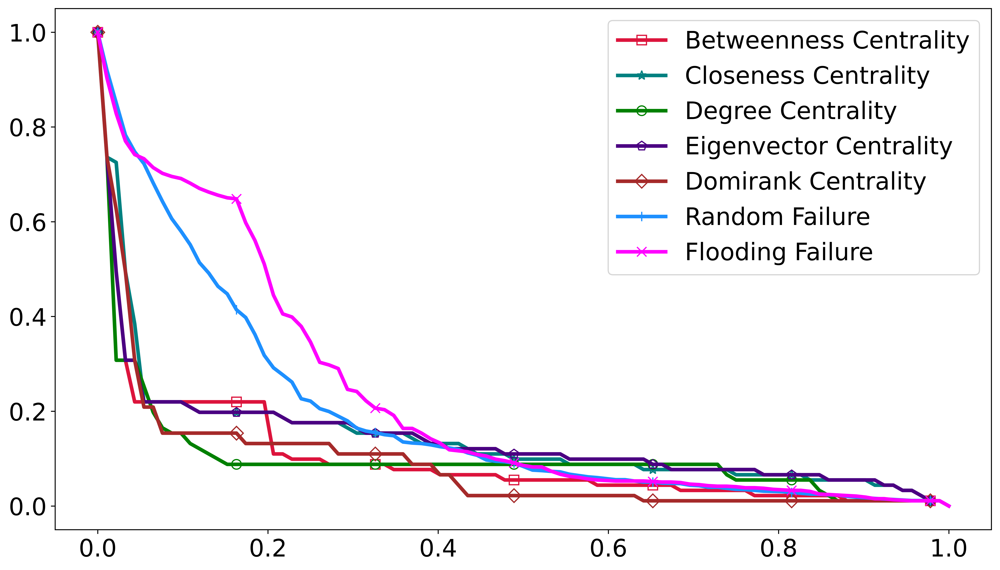

In [16]:
import matplotlib.pyplot as plt

# Assuming l_W, c_W, d_W, e_W are your data dictionaries, and colors and marker_style are defined
colors = ['crimson', 'teal', 'green','indigo', 'brown', 'dodgerblue', 'fuchsia']
Q = 3  # Assuming Q is your linewidth
marker_style = ['s', '*', 'o', 'p', 'D', '|', 'x']

plt.figure(figsize=(14,8),dpi=800)

plt.plot(l_W['arr_0'], l_W['arr_1'], color=colors[0], linestyle='-', marker=marker_style[0], label='Betweenness Centrality', markevery=15, markerfacecolor='none', markersize=8, linewidth=Q)
plt.plot(c_W['arr_0'], c_W['arr_1'], color=colors[1], linestyle='-', marker=marker_style[1], label='Closeness Centrality', markevery=15, markerfacecolor='none', markersize=8, linewidth=Q)
plt.plot(d_W['arr_0'], d_W['arr_1'], color=colors[2], linestyle='-', marker=marker_style[2], label='Degree Centrality', markevery=15, markerfacecolor='none', markersize=8, linewidth=Q)
plt.plot(e_W['arr_0'], e_W['arr_1'], color=colors[3], linestyle='-', marker=marker_style[3], label='Eigenvector Centrality', markevery=15, markerfacecolor='none', markersize=8, linewidth=Q)
plt.plot(dr_W['arr_0'], dr_W['arr_1'], color=colors[4], linestyle='-', marker=marker_style[4], label='Domirank Centrality', markevery=15, markerfacecolor='none', markersize=8, linewidth=Q)
plt.plot(r_W['arr_0'], r_W['arr_1'], color=colors[5], linestyle='-', marker=marker_style[5], label='Random Failure', markevery=15, markerfacecolor='none', markersize=8, linewidth=Q)
plt.plot(f_W['arr_0'], f_W['arr_1'], color=colors[6], linestyle='-', marker=marker_style[6], label='Flooding Failure', markevery=15, markerfacecolor='none', markersize=8, linewidth=Q)

plt.legend(fontsize=20)
plt.tick_params(axis='both', labelsize=20)
#plt.title('Washington DC (N=91, E=93)', fontsize=20)
#plt.xlabel('Your X-axis Label')  # Replace with your X-axis label
#plt.ylabel('Your Y-axis Label')  # Replace with your Y-axis label
plt.savefig('A:\Projects\DC.png')
plt.show()
